Assignment: **Face Resolution Enhancement**
Goal: The objective of this assignment is to implement a solution that takes a low-resolution face image (64x64 pixels) as input and produces a high-resolution, enhanced face image (256x256 pixels) using a UNET model.

**Import Libraries**

In [1]:
import os
import cv2 as cv
import numpy as np

import matplotlib.pyplot as plt

from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout, Conv2D, Conv2DTranspose, MaxPooling2D, GlobalMaxPool2D, concatenate
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras.optimizers import Adam
import tensorflow as tf

In [2]:
from google.colab import files
files.upload()   # upload kaggle.json


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"rhodes1roadio","key":"38afa26af2888db831d864a066e09a7f"}'}

In [3]:
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [4]:
!kaggle datasets download -d jessicali9530/celeba-dataset
!unzip celeba-dataset.zip -d celeba_data


Streaming output truncated to the last 5000 lines.
  inflating: celeba_data/img_align_celeba/img_align_celeba/197604.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197605.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197606.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197607.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197608.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197609.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197610.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197611.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197612.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197613.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197614.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197615.jpg  
  inflating: celeba_data/img_align_celeba/img_align_celeba/197616.jpg  
  inflating: 

** U-Net Model Definition**

This cell defines the U-Net model architecture for image super-resolution. The `unet_64to256` function creates a U-Net model that takes a 64x64x3 image as input and outputs a 256X256X3 image. It includes an encoder, a bottleneck, and a decoder with skip connections.

In [5]:
def unet_64to256(input_shape=(64, 64, 3), n_classes=3, final_activation='sigmoid', dropout_rate=0.05):
    inputs = Input(shape=input_shape, name='img')

    # --- Encoder ---
    c1 = Conv2D(16, (3,3), padding='same')(inputs)
    c1 = BatchNormalization()(c1); c1 = Activation('relu')(c1)
    c1 = Conv2D(16, (3,3), padding='same')(c1)
    c1 = BatchNormalization()(c1); c1 = Activation('relu')(c1)
    p1 = MaxPooling2D((2,2))(c1); p1 = Dropout(dropout_rate)(p1)   # 64 -> 32

    c2 = Conv2D(32, (3,3), padding='same')(p1)
    c2 = BatchNormalization()(c2); c2 = Activation('relu')(c2)
    c2 = Conv2D(32, (3,3), padding='same')(c2)
    c2 = BatchNormalization()(c2); c2 = Activation('relu')(c2)
    p2 = MaxPooling2D((2,2))(c2); p2 = Dropout(dropout_rate)(p2)   # 32 -> 16

    c3 = Conv2D(64, (3,3), padding='same')(p2)
    c3 = BatchNormalization()(c3); c3 = Activation('relu')(c3)
    c3 = Conv2D(64, (3,3), padding='same')(c3)
    c3 = BatchNormalization()(c3); c3 = Activation('relu')(c3)
    p3 = MaxPooling2D((2,2))(c3); p3 = Dropout(dropout_rate)(p3)   # 16 -> 8

    c4 = Conv2D(128, (3,3), padding='same')(p3)
    c4 = BatchNormalization()(c4); c4 = Activation('relu')(c4)
    c4 = Conv2D(128, (3,3), padding='same')(c4)
    c4 = BatchNormalization()(c4); c4 = Activation('relu')(c4)
    p4 = MaxPooling2D((2,2))(c4); p4 = Dropout(dropout_rate)(p4)   # 8 -> 4

    # --- Bottleneck ---
    c5 = Conv2D(256, (3,3), padding='same')(p4)
    c5 = BatchNormalization()(c5); c5 = Activation('relu')(c5)
    c5 = Conv2D(256, (3,3), padding='same')(c5)
    c5 = BatchNormalization()(c5); c5 = Activation('relu')(c5)

    # --- Decoder back to 64x64 ---
    u6 = Conv2DTranspose(128, (3,3), strides=(2,2), padding='same')(c5)  # 4 -> 8
    u6 = concatenate([u6, c4]); u6 = Dropout(dropout_rate)(u6)
    u6 = Conv2D(128, (3,3), padding='same')(u6)
    u6 = BatchNormalization()(u6); u6 = Activation('relu')(u6)
    u6 = Conv2D(128, (3,3), padding='same')(u6)
    u6 = BatchNormalization()(u6); u6 = Activation('relu')(u6)

    u7 = Conv2DTranspose(64, (3,3), strides=(2,2), padding='same')(u6)    # 8 -> 16
    u7 = concatenate([u7, c3]); u7 = Dropout(dropout_rate)(u7)
    u7 = Conv2D(64, (3,3), padding='same')(u7)
    u7 = BatchNormalization()(u7); u7 = Activation('relu')(u7)
    u7 = Conv2D(64, (3,3), padding='same')(u7)
    u7 = BatchNormalization()(u7); u7 = Activation('relu')(u7)

    u8 = Conv2DTranspose(32, (3,3), strides=(2,2), padding='same')(u7)    # 16 -> 32
    u8 = concatenate([u8, c2]); u8 = Dropout(dropout_rate)(u8)
    u8 = Conv2D(32, (3,3), padding='same')(u8)
    u8 = BatchNormalization()(u8); u8 = Activation('relu')(u8)
    u8 = Conv2D(32, (3,3), padding='same')(u8)
    u8 = BatchNormalization()(u8); u8 = Activation('relu')(u8)

    u9 = Conv2DTranspose(16, (3,3), strides=(2,2), padding='same')(u8)    # 32 -> 64
    u9 = concatenate([u9, c1]); u9 = Dropout(dropout_rate)(u9)
    u9 = Conv2D(16, (3,3), padding='same')(u9)
    u9 = BatchNormalization()(u9); u9 = Activation('relu')(u9)
    u9 = Conv2D(16, (3,3), padding='same')(u9)
    u9 = BatchNormalization()(u9); u9 = Activation('relu')(u9)

    # --- Extra upsample to 128x128 ---
    u10 = Conv2DTranspose(16, (3,3), strides=(2,2), padding='same')(u9)   # 64 -> 128
    u10 = Dropout(dropout_rate)(u10)
    u10 = Conv2D(16, (3,3), padding='same')(u10)
    u10 = BatchNormalization()(u10); u10 = Activation('relu')(u10)

    # --- NEW: Extra upsample to 256x256 ---
    u11 = Conv2DTranspose(16, (3,3), strides=(2,2), padding='same')(u10)   # 128 -> 256
    u11 = Dropout(dropout_rate)(u11)
    u11 = Conv2D(16, (3,3), padding='same')(u11)
    u11 = BatchNormalization()(u11); u11 = Activation('relu')(u11)

    outputs = Conv2D(n_classes, (1,1), activation=final_activation, name='mask')(u11)

    return Model(inputs=inputs, outputs=outputs, name='UNet_64to256')


**Model Initialization and Compilation**

This cell initializes the U-Net model with the specified input shape and number of classes. It then compiles the model using the Adam optimizer and mean absolute error (MAE) as the loss function. The input and output shapes are printed to verify the model architecture.

In [6]:
model = unet_64to256(input_shape=(64,64,3), n_classes=3, final_activation='sigmoid')

print('Input shape:', model.input_shape)   # (None, 64, 64, 3)
print('Output shape:', model.output_shape) # (None, 256, 256, 3)

model.compile(optimizer=Adam(1e-4), loss='mae')


Input shape: (None, 64, 64, 3)
Output shape: (None, 256, 256, 3)


***Data Generator***

This cell defines a data generator function `datagen` that loads and preprocesses images from the CelebA dataset. It resizes the images to 128x128 as ground truth and to 64x64 as low-resolution input, and normalizes the pixel values. The generator yields batches of low-resolution and high-resolution image pairs for training.

In [7]:
import os
import cv2 as cv
import numpy as np

# ✅ Change this path
IMG_DIR = '/content/celeba_data/img_align_celeba/img_align_celeba/'

imgs = os.listdir(IMG_DIR)

def datagen(batch_size):
    while True:
        x_batch = []
        y_batch = []

        for _ in range(batch_size):
            indx = np.random.randint(0, len(imgs))

            # ✅ use IMG_DIR instead of /kaggle/input/...
            bgr = cv.imread(os.path.join(IMG_DIR, imgs[indx]))

            # Check if the image was loaded successfully
            if bgr is None:
                print(f"Warning: Could not load image {imgs[indx]}. Skipping.")
                continue

            bgr = cv.resize(bgr, (256, 256))   # HR target
            rgb = cv.cvtColor(bgr, cv.COLOR_BGR2RGB)

            x = cv.resize(rgb, (64, 64))       # LR input
            x = x / 255.0
            y = rgb / 255.0

            x_batch.append(x)
            y_batch.append(y)

        x_batch = np.array(x_batch).reshape(batch_size, 64, 64, 3)
        y_batch = np.array(y_batch).reshape(batch_size, 256, 256, 3)

        yield x_batch, y_batch

**Model Training (Short Run)**

This cell trains the U-Net model for a small number of epochs (5) using the `datagen` function. This is a short run to quickly check if the model is training without errors.

In [8]:
batch_size = 32

batch_size = 32
num_images = len(imgs)
steps_per_epoch = num_images // batch_size


results = model.fit(datagen(batch_size=batch_size), steps_per_epoch=steps_per_epoch , epochs=5, verbose=1)

Epoch 1/5
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 722s 107ms/step - loss: 0.0645
Epoch 2/5
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 687s 109ms/step - loss: 0.0308
Epoch 3/5
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 682s 108ms/step - loss: 0.0289
Epoch 4/5
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 684s 108ms/step - loss: 0.0276
Epoch 5/5
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 683s 108ms/step - loss: 0.0252


In [9]:
import os

print("IMG_DIR:", IMG_DIR)
print("Number of files:", len(imgs))
print("First 5 files:", imgs[:5])

# Check one file path
sample_path = os.path.join(IMG_DIR, imgs[0])
print("Sample path:", sample_path)
print("File exists:", os.path.exists(sample_path))

IMG_DIR: /content/celeba_data/img_align_celeba/img_align_celeba/
Number of files: 202599
First 5 files: ['030223.jpg', '087449.jpg', '055049.jpg', '081370.jpg', '097828.jpg']
Sample path: /content/celeba_data/img_align_celeba/img_align_celeba/030223.jpg
File exists: True


**Model Training with Callbacks and Sample Saving**

This cell trains the U-Net model for a longer duration (3 epochs) and includes custom callbacks. The `show_and_save_samples` function generates and saves sample super-resolved images at the end of each epoch, along with the original, ground truth, and low-resolution images for comparison. The `LambdaCallback` is used to execute this function after each epoch. The model checkpoints are also saved during training.

Epoch 1/3
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step - loss: 0.0233

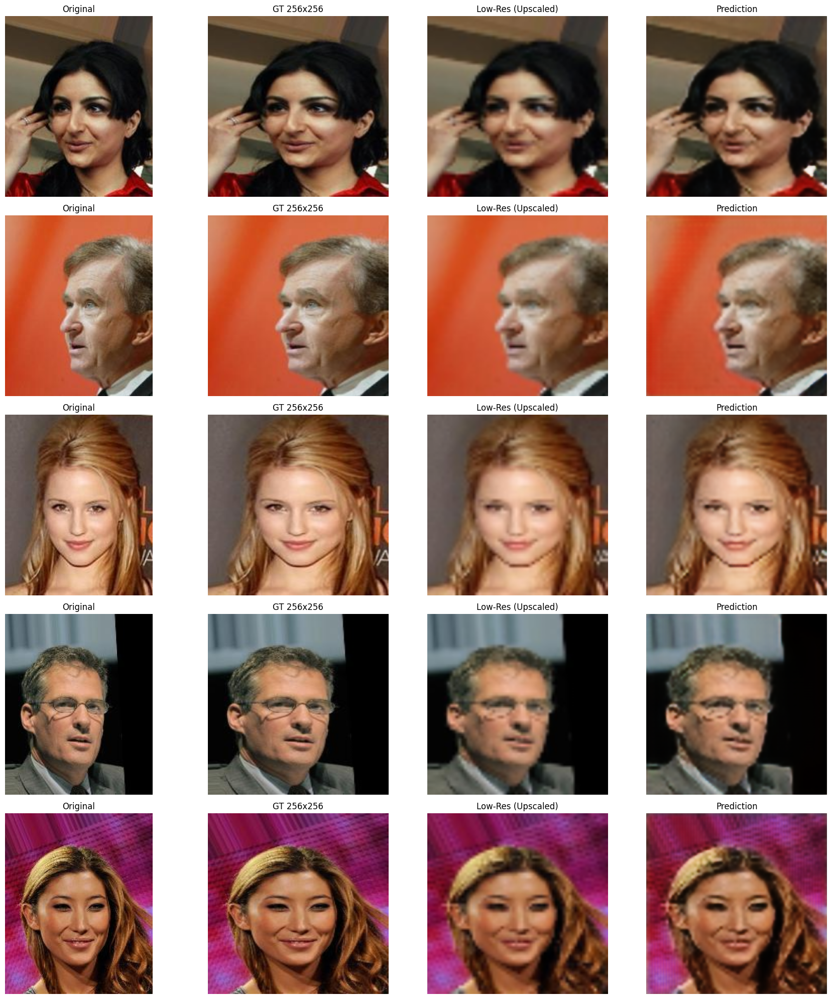

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 685s 108ms/step - loss: 0.0233
Epoch 2/3
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step - loss: 0.0227

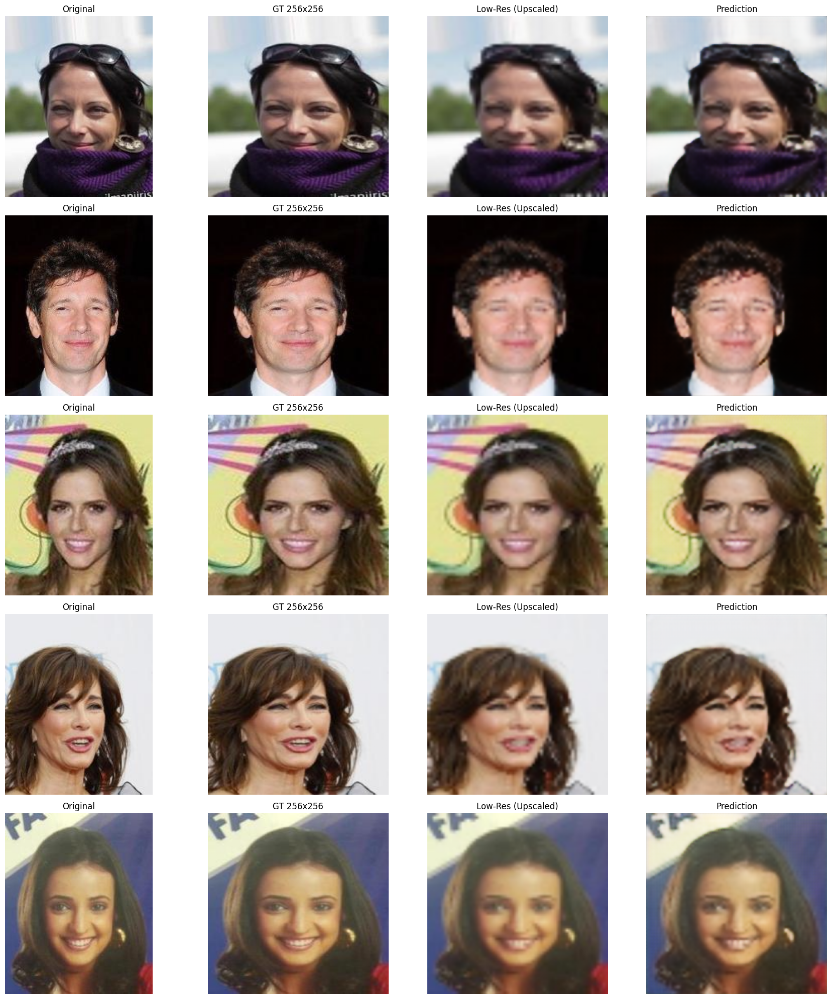

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 808s 128ms/step - loss: 0.0227
Epoch 3/3
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - loss: 0.0223

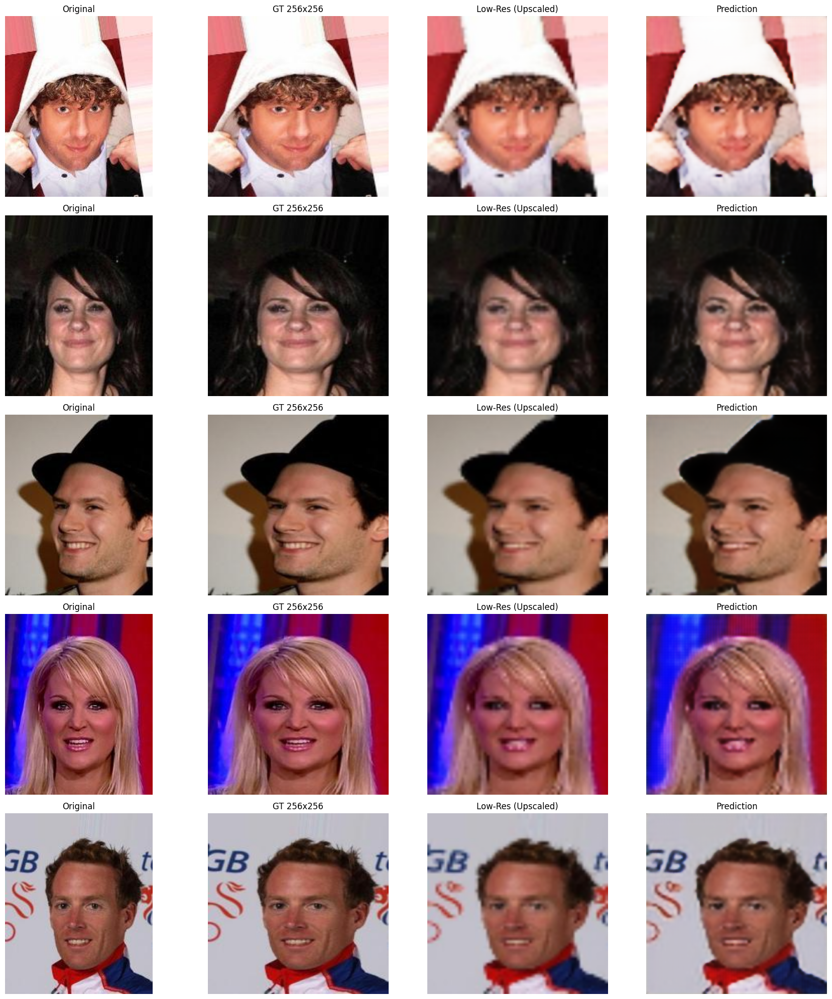

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 856s 135ms/step - loss: 0.0223


In [10]:
import os, cv2 as cv, numpy as np, matplotlib.pyplot as plt, tensorflow as tf

# --- Show & Save Samples ---
def show_and_save_samples(model, imgs, base_dir, epoch, n=5, save_dir='./epoch_samples'):
    os.makedirs(save_dir, exist_ok=True)
    chosen = np.random.choice(imgs, n, replace=False)
    fig, axes = plt.subplots(n, 4, figsize=(18, 4*n))
    if n == 1: axes = np.expand_dims(axes, 0)

    for i, fname in enumerate(chosen):
        path = os.path.join(base_dir, fname)
        rgb = cv.cvtColor(cv.imread(path), cv.COLOR_BGR2RGB)

        gt256 = cv.resize(rgb, (256,256)).astype('float32')/255   # ✅ Ground Truth
        img64 = cv.resize(rgb, (64,64)).astype('float32')/255     # ✅ Low-res input
        pred  = model.predict(np.expand_dims(img64,0), verbose=0)[0]  # ✅ Prediction 256x256
        lowup = cv.resize((img64*255).astype(np.uint8),(256,256))     # ✅ Upscaled low-res

        for ax, im, title in zip(
            axes[i],[rgb,gt256,lowup,pred],
            ['Original','GT 256x256','Low-Res (Upscaled)','Prediction']
        ):
            ax.imshow(im); ax.set_title(title); ax.axis('off')

    plt.tight_layout()
    plt.savefig(f"{save_dir}/epoch_{epoch+1:02d}.png")
    plt.show()

# --- Callback ---
def on_epoch_end(epoch, logs):
    show_and_save_samples(model, imgs, base_dir, epoch, n=5)
    model.save(f'./checkpoints/model_epoch_{epoch+1:02d}.keras')

show_cb = tf.keras.callbacks.LambdaCallback(on_epoch_end=on_epoch_end)

# --- Training ---
batch_size = 32
base_dir = '/content/celeba_data/img_align_celeba/img_align_celeba/'   # ✅ FIXED PATH
imgs = [f for f in os.listdir(base_dir) if f.endswith('.jpg')]

steps_per_epoch = len(imgs) // batch_size
os.makedirs('./checkpoints', exist_ok=True)

results = model.fit(
    datagen(batch_size=batch_size),   # ✅ yields (64x64 input, 256x256 target)
    steps_per_epoch=steps_per_epoch,
    epochs=3,
    callbacks=[show_cb],
    verbose=1
)


**Inference & Visualizations**

In [14]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

def enhance_and_show(model, img_path):
    # --- Load & preprocess ---
    bgr = cv.imread(img_path)
    rgb = cv.cvtColor(bgr, cv.COLOR_BGR2RGB)

    # Prepare input (64x64 normalized)
    img64 = cv.resize(rgb, (64,64)).astype('float32') / 255.0
    inp = np.expand_dims(img64, axis=0)   # (1,64,64,3)

    # --- Predict ---
    pred = model.predict(inp, verbose=0)[0]   # (256,256,3)
    pred = np.clip(pred, 0, 1)

    # --- Postprocess ---
    out256 = (pred * 255).astype(np.uint8)
    lowup  = cv.resize((img64*255).astype(np.uint8), (256,256))  # bicubic upscale for reference

    # --- Display ---
    fig, axes = plt.subplots(1, 3, figsize=(15,5))
    axes[0].imshow(img64);  axes[0].set_title("Input 64x64");  axes[0].axis("off")
    axes[1].imshow(lowup);  axes[1].set_title("Bicubic Upscale 256x256"); axes[1].axis("off")
    axes[2].imshow(out256); axes[2].set_title("UNet Output 256x256"); axes[2].axis("off")
    plt.show()

    return out256


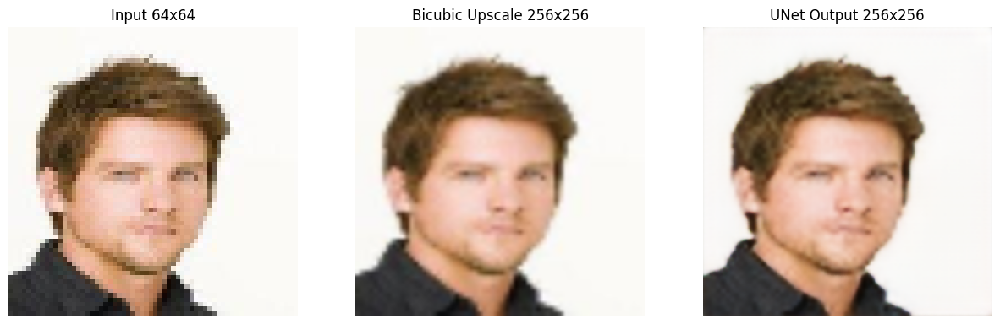

In [15]:
test_img = os.path.join(base_dir, imgs[0])   # pick one CelebA image
out_img = enhance_and_show(model, test_img)


**Insights:**

 As we can see there is slight improvement in image while using UNet , it can be further improve by training for more epochs.